In [1]:
!pip uninstall -y -q transformers tokenizers huggingface-hub pydantic datasets pyarrow accelerate safetensors
!pip install -q --upgrade "pip<25" wheel setuptools
!pip install -q --no-cache-dir \
  "transformers @ git+https://github.com/huggingface/transformers@v4.49.0-Gemma-3" \
  "huggingface_hub>=0.25.2" \
  "tokenizers>=0.20.1" \
  "accelerate>=1.1.0" \
  "safetensors>=0.4.5" \
  "pydantic<2.12" \
  "datasets>=3.1.0" \
  "pyarrow>=21.0.0"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 54.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
kaggle-environments 1.18.0 requires transformers>=4.33.1, which is not installed.
thinc 8.3.6 requires pydantic<3.0.0,>=2.0.0, which is not installed.
pandas-gbq 0.29.2 requires pyarrow>=4.0.0, which is not installed.
bigquery-magics 0.10.1 requires pyarrow>=3.0.0, which is not installed.
spacy 3.8.7 requires pydantic!=1.8,!=1.8.1,<3.0.0,>=1.7.4, which is not installed.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
pandas-gbq 0.29.2 requires google-api-core<3.0.0,>=2.10.2, but you have google-api-core 1.34.1 which is incompatible.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
 

In [2]:


# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/model.safetensors.index.json
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/config.json
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/preprocessor_config.json
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/model-00005-of-00005.safetensors
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/model-00001-of-00005.safetensors
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/model-00002-of-00005.safetensors
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/tokenizer.json
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/tokenizer_config.json
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/chat_template.json
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/model-00004-of-00005.safetensors
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/model-00003-of-00005.safetensors
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/processor_config.json
/kaggle/input/gemma-3/transformers/gemma-3-12b-it/1/special_tokens_

# Let's load all JSON files into memory

In [3]:
import json
import os
import psutil
import gc

paths = {
    "league": "/kaggle/input/who-s-the-best-pitcher-v2/archive/data/data/league/league.json",
    "players": "/kaggle/input/who-s-the-best-pitcher-v2/archive/data/data/players/players.json",
    "teams": "/kaggle/input/who-s-the-best-pitcher-v2/archive/data/data/teams/teams.json",
}

def memory_usage_gb():
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / (1024 ** 3)

print(f"Initial RAM usage: {memory_usage_gb():.2f} GB")

# Load each JSON file and print usage
loaded = {}
for name, path in paths.items():
    print(f"\nLoading {name} from {path} ...")
    with open(path, "r") as f:
        loaded[name] = json.load(f)
    print(f"{name} loaded ✅ — RAM usage: {memory_usage_gb():.2f} GB")

print("\nAll files loaded successfully.")


Initial RAM usage: 0.19 GB

Loading league from /kaggle/input/who-s-the-best-pitcher-v2/archive/data/data/league/league.json ...
league loaded ✅ — RAM usage: 0.19 GB

Loading players from /kaggle/input/who-s-the-best-pitcher-v2/archive/data/data/players/players.json ...
players loaded ✅ — RAM usage: 1.97 GB

Loading teams from /kaggle/input/who-s-the-best-pitcher-v2/archive/data/data/teams/teams.json ...
teams loaded ✅ — RAM usage: 2.05 GB

All files loaded successfully.


# flatten json(most important step)

🧩 Flattening JSON Example

Input JSON

> {
  "seasons": [
    {
      "id": "a7c6c8ee-c5ba-4a1a-abf5-723e1539f81b",
      "year": 2025,
      "type": "REG",
      "teams": [
        {
          "id": "583ec8d4-fb46-11e1-82cb-f4ce4684ea4c",
          "name": "Wizards",
          "market": "Washington",
          "alias": "WAS"
        }
      ]
    }
  ]
}

➡️ Flattened Output

> {
  "seasons.0.teams.0.total.assists": 3,
  "seasons.0.teams.0.total.turnovers": 1,
  "seasons.0.teams.0.total.assists_turnover_ratio": 3.0,
  "seasons.0.teams.0.total.steals": 0
}

### so for each value in all data we will have a clear path

In [4]:
league = loaded["league"]
teams = loaded["teams"]
players = loaded["players"]

## read test set

In [5]:
test = pd.read_csv("/kaggle/input/who-s-the-best-pitcher-v2/archive/test.csv")

In [6]:
!pip install -q flatten_json


In [7]:
%%time
from flatten_json import flatten

players = flatten(players,".")
teams = flatten(teams, ".")
league = flatten(league, ".")

CPU times: user 48.3 s, sys: 6.04 s, total: 54.3 s
Wall time: 54.3 s


In [8]:
%%time

def to_df(dict_obj):
    paths = dict_obj.keys()
    values = dict_obj.values()
    dict_df = pd.DataFrame({"paths":paths,"values":values})
    return dict_df

players_df = to_df(players)
teams_df = to_df(teams)
league_df = to_df(league)

del players, teams, league
gc.collect()

CPU times: user 10.8 s, sys: 1.36 s, total: 12.2 s
Wall time: 12.1 s


27

In [9]:
# players_df = players_df.sample(1000)
# teams_df = teams_df.sample(1000)
# league_df = league_df.sample(1000)

In [10]:
%%time
players_df = players_df[~players_df.paths.str.endswith(".id")]
players_df = players_df[~players_df.paths.str.endswith("_comment")]
players_df = players_df[~players_df.paths.str.startswith("skeletons.")]

teams_df = teams_df[~teams_df.paths.str.endswith(".id")]
teams_df = teams_df[~teams_df.paths.str.endswith("._comment")]
teams_df = teams_df[~teams_df.paths.str.startswith("skeletons.")]


league_df = league_df[~league_df.paths.str.endswith(".id")]
league_df = league_df[~league_df.paths.str.endswith("_comment")]
league_df = league_df[~league_df.paths.str.startswith("skeletons.")]
gc.collect()

CPU times: user 35.4 s, sys: 2.46 s, total: 37.9 s
Wall time: 37.8 s


127

In [11]:
all_players_names = loaded["players"].keys()
all_teams_names = loaded["teams"].keys()

In [12]:
print(list(all_players_names)[:5])
print("-"*70)
print(list(all_teams_names)[:5])

['shelby_miller', 'austin_riley', 'alejandro_kirk', 'troy_melton', 'brandon_eisert']
----------------------------------------------------------------------
['los_angeles_angels', 'houston_astros', 'athletics', 'toronto_blue_jays', 'atlanta_braves']


# Approach
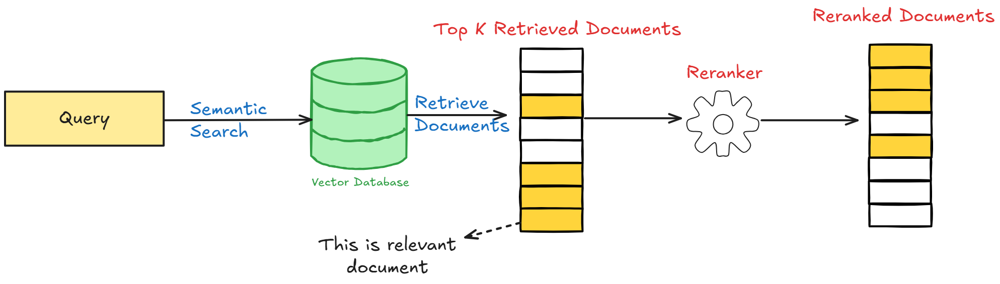
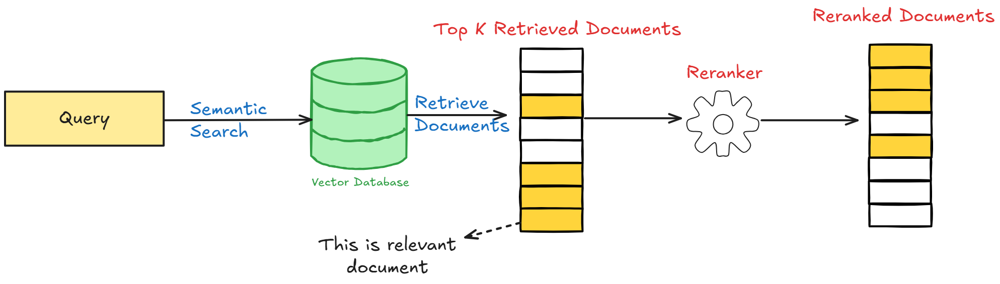

In [13]:
print(test.question.values[0])

How many innings did Miles Mikolas pitch in April 2025?


> The main challenge in this task is filtering out a large amount of data before even starting modeling or making predictions.

## Extracting Entity Names from a CSV

> We can extract entity names from the CSV manually, with regex, using NER models, or via free web APIs (e.g., ChatGPT, Gemini).

Reviewing **220 questions** will take approximately **15 minutes**.

### Example

**Question:**  
> How many innings did Miles Mikolas pitch in April 2025?

**Extracted entity:**  
`Miles Mikolas`

**matched prefix:**  
`miles_mikolas`

## Matching Extracted Entities

After extracting entity names from the CSV,  
we can match these entities against `all_players_names` and `all_teams_names`. using fuzzy_search for example

### Observations on Data Structure and Question Sources

By analyzing the structure of the **league**, **teams**, and **players** JSON files, we can determine the appropriate source for many of the 220 questions. Specifically, we can classify questions based on whether they relate to:

- **League-level data**
- **Team-level data**
- **Player-level data**

This allows us to select the correct data source and prefix during retrieval.

#### Example

**Question:** *"What is the primary position of injured Nolan Arenado?"*

We know that **injury information** is stored within the **league data**.  
Therefore, this question should be treated as **league-based**, and the appropriate **prefix** is:

In [14]:
l2 = [{'question': 'What is the primary position of injured Nolan Arenado?',
  'prefix': 'league'},
 {'question': 'What position does injured Tyler Stephenson play for the Cincinnati Reds?',
  'prefix': 'league'},
 {'question': "What is the update date for injured Michael Kopech's knee injury?",
  'prefix': 'league'},
 {'question': 'What position does injured Dan Altavilla play for the Chicago White Sox?',
  'prefix': 'league'},
 {'question': "When is the start date for injured Cody Bradford's elbow injury?",
  'prefix': 'league'},
 {'question': "What is Tanner Houck's jersey number with the Boston Red Sox?",
  'prefix': 'league'},
 {'question': "What is the update date for Kevin Ginkel's shoulder injury?",
  'prefix': 'league'},
 {'question': 'How many division titles have the New York Mets won?',
  'prefix': 'league'},
 {'question': 'What is the division elimination number for the Baltimore Orioles?',
  'prefix': 'league'},
 {'question': 'What is the abbreviation for the New York Mets in the Grapefruit League?',
  'prefix': 'league'},
 {'question': 'How many games back are the Chicago Cubs in the standings?',
  'prefix': 'league'},
 {'question': 'How many away losses do the Cleveland Guardians have in the spring league of the 2025 season?',
  'prefix': 'league'},
 {'question': 'How many losses do the Seattle Mariners have in the preseason standings?',
  'prefix': 'league'},
 {'question': 'What city is the venue for the Kansas City Royals located in?',
  'prefix': 'league'},
 {'question': 'How many home losses do the St. Louis Cardinals have in the 2025 regular season?',
  'prefix': 'league'},
 {'question': 'When was the Chicago White Sox founded?', 'prefix': 'league'},
 {'question': 'What is the win percentage of the Cleveland Guardians in the 2025 regular season?',
  'prefix': 'league'},
 {'question': "What is the St. Louis Cardinals' rank in the National League?",
  'prefix': 'league'},
 {'question': 'How many playoff appearances have the Pittsburgh Pirates made?',
  'prefix': 'league'},
 {'question': 'How many home wins do the San Diego Padres have in the 2025 regular season?',
  'prefix': 'league'},
 {'question': 'How many wins do the Baltimore Orioles have in the 2025 season?',
  'prefix': 'league'},
 {'question': 'How many away losses do the Cincinnati Reds have?',
  'prefix': 'league'},
 {'question': 'What is the winning percentage of the Chicago Cubs in the 2025 preseason?',
  'prefix': 'league'},
 {'question': 'What is the mascot of the San Francisco Giants?',
  'prefix': 'league'},
 {'question': 'How many home wins do the Los Angeles Dodgers have in the 2025 preseason?',
  'prefix': 'league'},
 {'question': 'What position does Freddy Peralta play in the MLB?',
  'prefix': 'league'},
 {'question': 'How many home wins do the Washington Nationals have in the spring league of the 2025 preseason?',
  'prefix': 'league'},
 {'question': 'How many away games have the Pittsburgh Pirates won in the 2025 season?',
  'prefix': 'league'},
 {'question': 'How many games back are the Arizona Diamondbacks in the wild card race?',
  'prefix': 'league'},
 {'question': 'What position does Tarik Skubal play?', 'prefix': 'league'},
 {'question': 'What was the number of wild pitches recorded by the Yankees in their game against the Red Sox 3 matches ago?',
  'prefix': 'brennan_bernardino'},
 {'question': 'How many batters did Aaron Bummer walk while pitching against the Detroit Tigers in the 2021 regular season?',
  'prefix': 'aaron_bummer'},
 {'question': "What is Grayson Rodriguez's on-base percentage from singles during the 2023 season with the Baltimore Orioles?",
  'prefix': 'grayson_rodriguez'},
 {'question': "How many times did Danny Coulombe play at Texas' Globe Life Field during the 2023 regular season?",
  'prefix': 'danny_coulombe'},
 {'question': "What was Tyler Holton's average number of pitches per batter faced in the bullpen during the 2022 preseason?",
  'prefix': 'tyler_holton'},
 {'question': "What is Kaleb Ort's on-base average (OBA) when pitching at Baltimore Oriole Park at Camden Yards during the 2023 regular season?",
  'prefix': 'kaleb_ort'},
 {'question': "What was Randal Grichuk's OPS at Toronto's Rogers Centre during the 2025 regular season?",
  'prefix': 'randal_grichuk'},
 {'question': "What was Jacob deGrom's away team loss in the 2016 regular season?",
  'prefix': 'jacob_degrom'},
 {'question': "What was José Alvarado's strikeout-to-walk ratio in the 2020 postseason?",
  'prefix': 'josé_alvarado'},
 {'question': "What was Kevin Gausman's innings pitched on turf with the Baltimore Orioles in 2018?",
  'prefix': 'kevin_gausman'},
 {'question': 'How many innings did Trent Thornton pitch against the Kansas City Royals in 2022?',
  'prefix': 'trent_thornton'},
 {'question': 'How many innings did Merrill Kelly pitch against the New York Mets in his first game of the 2023 regular season?',
  'prefix': 'merrill_kelly'},
 {'question': "What is Oswaldo Cabrera's on-base percentage at Cleveland's Progressive Field in 2025?",
  'prefix': 'oswaldo_cabrera'},
 {'question': 'How many innings did Walker Buehler pitch for the Los Angeles Dodgers in May 2022?',
  'prefix': 'walker_buehler'},
 {'question': "How many home runs did Garrett Cleavinger allow while pitching at Minnesota's Target Field in the 2022 regular season?",
  'prefix': 'garrett_cleavinger'},
 {'question': "What was Andrew Kittredge's team loss at home during the 2017 regular season?",
  'prefix': 'andrew_kittredge'},
 {'question': "What is Ketel Marte's number of hits during night games in the 2024 regular season?",
  'prefix': 'ketel_marte'},
 {'question': "What is Tyler O'Neill's on-base percentage with the Baltimore Orioles in the 2025 regular season?",
  'prefix': 'tyler_oneill'},
 {'question': "What is Trea Turner's OPS against the Cincinnati Reds in the 2023 regular season?",
  'prefix': 'trea_turner'},
 {'question': 'How many saves does Roddery Muñoz have in the 2025 season with the St. Louis Cardinals?',
  'prefix': 'roddery_muñoz'},
 {'question': 'How many times did Josh Simpson release the slider pitch type in the 2024 Spring Training?',
  'prefix': 'josh_simpson'},
 {'question': 'What is the market for the home game played by the New York Yankees 2 matches ago?',
  'prefix': 'trent_grisham'},
 {'question': 'What market does the St. Louis Cardinals belong to?',
  'prefix': 'seth_lugo'},
 {'question': 'How many runs batted in (RBI) did Shohei Ohtani have against the Houston Astros in the 2021 regular season?',
  'prefix': 'shohei_ohtani'},
 {'question': "What was Michael Lorenzen's bullpen runs allowed in the 2020 regular season?",
  'prefix': 'michael_lorenzen'},
 {'question': 'Did Colson Montgomery have 0 caught stealing against the Kansas City Royals in 2024 Spring Training?',
  'prefix': 'colson_montgomery'},
 {'question': 'How many games did the Los Angeles Dodgers lose against the Atlanta Braves in the 2022 regular season?',
  'prefix': 'walker_buehler'},
 {'question': 'How many hits did Pierce Johnson record in the 2023 postseason?',
  'prefix': 'pierce_johnson'},
 {'question': 'How many runs did Corbin Carroll score in March 2021 for the Arizona Diamondbacks?',
  'prefix': 'corbin_carroll'},
 {'question': 'How many at-bats did Daniel Johnson have at Lecom Park for the Baltimore Orioles in the 2024 preseason?',
  'prefix': 'daniel_johnson'},
 {'question': 'What is the pitcher hand of Mike Yastrzemski against left-handed pitchers?',
  'prefix': 'mike_yastrzemski'},
 {'question': "What was Corey Seager's OPS in April 2021?",
  'prefix': 'corey_seager'},
 {'question': 'How many runs did Jeff McNeil score at Los Angeles Angel Stadium in the 2024 season?',
  'prefix': 'jeff_mcneil'},
 {'question': "What is Scott Barlow's overall opponent batting average at PNC Park in the 2025 regular season?",
  'prefix': 'scott_barlow'},
 {'question': 'How many times did Johan Oviedo hit a batter in the game against the Colorado Rockies three matches ago?',
  'prefix': 'johan_oviedo'},
 {'question': 'Did John Schreiber record any blown saves in the game 4 matches ago against the Kansas City Royals?',
  'prefix': 'john_schreiber'},
 {'question': 'Did Caleb Thielbar start any games for the Minnesota Twins in 2020?',
  'prefix': 'caleb_thielbar'},
 {'question': 'What market do the San Francisco Giants belong to?',
  'prefix': 'jack_dreyer'},
 {'question': 'How many games did Matt Festa play for the Cleveland Guardians in June 2025?',
  'prefix': 'matt_festa'},
 {'question': 'How many wins did Brent Suter achieve in the 2021 regular season as a reliever?',
  'prefix': 'brent_suter'},
 {'question': "What was Emmet Sheehan's save count against the Houston Astros in the 2025 regular season?",
  'prefix': 'emmet_sheehan'},
 {'question': 'How many strikeouts did Jack Flaherty achieve in August 2019 while playing for the St. Louis Cardinals?',
  'prefix': 'jack_flaherty'},
 {'question': 'Did Garrett Crochet play against the Arizona Diamondbacks in 2023?',
  'prefix': 'garrett_crochet'},
 {'question': "What is Luke Weaver's slugging percentage against right-handed hitters in the 2024 season?",
  'prefix': 'luke_weaver'},
 {'question': "What was Salvador Perez's total number of assists as a catcher in the 2021 season?",
  'prefix': 'salvador_perez'},
 {'question': "What was Anthony DeSclafani's innings pitched in day games during the 2020 regular season?",
  'prefix': 'anthony_desclafani'},
 {'question': 'What was the K/9 statistic for Brad Lord in the game against the New York Mets 5 matches ago?',
  'prefix': 'brady_house'},
 {'question': "What was Chris Bassitt's away innings pitched in 2022?",
  'prefix': 'chris_bassitt'},
 {'question': "What was Tim Mayza's on-base average during March 2023?",
  'prefix': 'tim_mayza'},
 {'question': 'What was the BABIP for the starting pitchers in the game between the Kansas City Royals and the Detroit Tigers two matches ago?',
  'prefix': 'salvador_perez'},
 {'question': "What was Brad Keller's earned run average (ERA) in May 2021?",
  'prefix': 'brad_keller'},
 {'question': 'How many putouts did Keegan Akin record in the game played 5 matches ago?',
  'prefix': 'keegan_akin'},
 {'question': 'How many intentional walks did Ryne Stanek issue in May 2018 while playing for the Tampa Bay Rays?',
  'prefix': 'ryne_stanek'},
 {'question': 'What was the overall slugging percentage for the Cleveland Guardians in their previous match on August 24, 2025?',
  'prefix': 'david_fry'},
 {'question': "What was Trent Thornton's innings pitched against the Baltimore Orioles in the 2022 regular season bullpen?",
  'prefix': 'trent_thornton'},
 {'question': 'What market is associated with the St. Louis Busch Stadium where José Ramírez played for the Cleveland Guardians in 2021?',
  'prefix': 'josé_ramírez'},
 {'question': 'How many RBIs did the Los Angeles Dodgers score in their previous match against the San Diego Padres?',
  'prefix': 'yoshinobu_yamamoto'},
 {'question': "What is Tomoyuki Sugano's on-base average (OBA) for May in the 2025 season with the Baltimore Orioles?",
  'prefix': 'tomoyuki_sugano'},
 {'question': "What was Pablo López's earned run total against the New York Yankees in 2024?",
  'prefix': 'pablo_lópez'},
 {'question': 'What is the number of home runs hit by Pavin Smith against left-handed pitchers in the 2023 preseason?',
  'prefix': 'pavin_smith'},
 {'question': "What was Martín Pérez's total strikeouts in day games during the 2022 season?",
  'prefix': 'martín_pérez'},
 {'question': 'What was the number of games won by the Toronto Blue Jays when playing on turf in 2021?',
  'prefix': 'alek_manoah'},
 {'question': 'What was the number of home runs hit by Kenley Jansen in the preseason of 2021 at surprise stadium?',
  'prefix': 'kenley_jansen'},
 {'question': 'What was the on-base average (OBA) for the pitching overall of the San Francisco Giants four matches ago?',
  'prefix': 'wilmer_flores'},
 {'question': 'What total number of runs did Michael King allow in 2019?',
  'prefix': 'michael_king'},
 {'question': 'How many hits did Colin Rea record while pitching in night games for the Milwaukee Brewers in 2021?',
  'prefix': 'colin_rea'},
 {'question': 'How many games did Ben Bowden play in the hitting overall statistics during the 2021 preseason?',
  'prefix': 'ben_bowden'},
 {'question': "What was Connor Phillips' save opportunity count when pitching against the Texas Rangers in 2025?",
  'prefix': 'connor_phillips'},
 {'question': 'Did Juan Burgos earn a save in the game played 4 matches ago?',
  'prefix': 'juan_morillo'},
 {'question': "What is Javier Báez's home run total at Chicago's Rate Field for the 2025 season?",
  'prefix': 'javier_báez'},
 {'question': 'How many walks did Ryan Thompson allow during day games in the 2020 regular season?',
  'prefix': 'ryan_thompson'},
 {'question': 'How many innings did Miguel Castro pitch in the day games during the 2020 preseason?',
  'prefix': 'miguel_castro'},
 {'question': "What was Niko Kavadas' overall RBI in the previous match?",
  'prefix': 'niko_kavadas'},
 {'question': 'What was the overall pitching value for Enyel De Los Santos with the New York Yankees in August 2024?',
  'prefix': 'enyel_de_los_santos'},
 {'question': 'How many runs did Anthony DeSclafani allow at PNC Park in 2021?',
  'prefix': 'anthony_desclafani'},
 {'question': "What was Lake Bachar's on-base average (OBA) in March 2020?",
  'prefix': 'lake_bachar'},
 {'question': 'How many innings did Miles Mikolas pitch in April 2025?',
  'prefix': 'miles_mikolas'},
 {'question': 'How many home runs did Yusei Kikuchi allow against the Seattle Mariners in the 2020 regular season?',
  'prefix': 'yusei_kikuchi'},
 {'question': "What was Osvaldo Bido's overall gofo in the game 4 matches ago?",
  'prefix': 'osvaldo_bido'},
 {'question': "How many times did A.J. Minter play at Chicago's Wrigley Field while with the Atlanta Braves in the 2018 regular season?",
  'prefix': 'a_j_minter'},
 {'question': "What was Taj Bradley's earned run total in September during the 2023 season?",
  'prefix': 'taj_bradley'},
 {'question': 'What was the ground ball to fly ball ratio for the Houston Astros in the previous match?',
  'prefix': 'samuel_basallo'},
 {'question': 'How many games did Orelvis Martinez play at shortstop for the Toronto Blue Jays in the 2023 preseason?',
  'prefix': 'orelvis_martinez'},
 {'question': "What is Michael A. Taylor's on-base percentage against the Cleveland Guardians in the 2025 regular season?",
  'prefix': 'michael_a_taylor'},
 {'question': "What is Adrian Houser's away ERA for the 2023 preseason with the Milwaukee Brewers?",
  'prefix': 'adrian_houser'},
 {'question': 'How many batters faced Caleb Thielbar in the game 5 matches ago?',
  'prefix': 'chicago_cubs'},
 {'question': 'What is the number of innings pitched by the Arizona Diamondbacks against the Seattle Mariners?',
  'prefix': 'arizona_diamondbacks'},
 {'question': "What was the number of swings and misses (kswing) recorded by the Tampa Bay Rays' pitchers in the game played 5 matches ago?",
  'prefix': 'tampa_bay_rays'},
 {'question': 'What was the total strikeouts for the Boston Red Sox bullpen in April 2025?',
  'prefix': 'boston_red_sox'},
 {'question': "What was the number of walks by the Oakland Athletics' starters in June 2025?",
  'prefix': 'athletics'},
 {'question': 'How many fly balls did Andrew Chafin record in his pitching statistics during the game 5 matches ago?',
  'prefix': 'los_angeles_angels'},
 {'question': 'What market do the New York Mets belong to?',
  'prefix': 'atlanta_braves'},
 {'question': "How many games did the Miami Marlins' starting pitchers play in the 2023 season?",
  'prefix': 'miami_marlins'},
 {'question': "What is the ERA of the Cleveland Guardians' starting pitchers at Chicago's Wrigley Field in 2023?",
  'prefix': 'cleveland_guardians'},
 {'question': 'What is the batting average of the Atlanta Braves against the San Francisco Giants in the 2023 season?',
  'prefix': 'atlanta_braves'},
 {'question': 'What is the total number of games won by the Arizona Diamondbacks on grass surfaces during the 2025 season?',
  'prefix': 'arizona_diamondbacks'},
 {'question': 'What position did the player batting second in the Seattle Mariners lineup play in their game 4 matches ago?',
  'prefix': 'seattle_mariners'},
 {'question': 'How many saves did the Baltimore Orioles achieve against the Los Angeles Angels in 2024?',
  'prefix': 'baltimore_orioles'},
 {'question': 'What was the on-base percentage (OBP) of the Los Angeles Angels in their game 3 matches ago?',
  'prefix': 'los_angeles_angels'},
 {'question': 'How many swing strikes did Brayan Rocchio have in the game 3 matches ago against the Texas Rangers?',
  'prefix': 'cleveland_guardians'},
 {'question': "What was the number of balls thrown by the home team's starting pitcher Tarik Skubal five matches ago?",
  'prefix': 'detroit_tigers'},
 {'question': 'How many hits did the Miami Marlins achieve against the Minnesota Twins in 2023?',
  'prefix': 'miami_marlins'},
 {'question': 'What was the overall fielding statistic for Brad Lord in the first inning of the game that took place five matches ago?',
  'prefix': 'new_york_mets'},
 {'question': 'What was the total number of pitches thrown by Cal Quantrill in the game against the New York Mets two matches ago?',
  'prefix': 'new_york_mets'},
 {'question': 'How many groundballs did Kyle Higashioka have in the game 5 matches ago against the Kansas City Royals?',
  'prefix': 'kansas_city_royals'},
 {'question': 'How many putouts did Josh Smith achieve in the first inning of the previous match against the Cleveland Guardians?',
  'prefix': 'texas_rangers'},
 {'question': "How many saves did the Oakland Athletics' bullpen record in the 2023 season?",
  'prefix': 'athletics'},
 {'question': 'What is the overall ISO for the Baltimore Orioles in the 2023 season?',
  'prefix': 'baltimore_orioles'},
 {'question': 'How many walks did the Philadelphia Phillies have in October 2023?',
  'prefix': 'philadelphia_phillies'},
 {'question': "What is the number of walks contributed by the New York Mets' bullpen at PNC Park?",
  'prefix': 'new_york_mets'},
 {'question': 'What was the number of at-bats the New York Yankees had against the Seattle Mariners in the 2024 season?',
  'prefix': 'new_york_yankees'},
 {'question': 'How many saves did the Milwaukee Brewers achieve against the Pittsburgh Pirates in 2025?',
  'prefix': 'milwaukee_brewers'},
 {'question': "What is the number of innings pitched by the Milwaukee Brewers bullpen at Atlanta's Truist Park in 2024?",
  'prefix': 'milwaukee_brewers'},
 {'question': "What was Wenceel Pérez's overall fielding range factor in the game against the Kansas City Royals?",
  'prefix': 'detroit_tigers'},
 {'question': "Did the Atlanta Braves' pitchers complete their game at Chicago Wrigley Field?",
  'prefix': 'atlanta_braves'},
 {'question': "How many walks did the Chicago Cubs' starting pitcher allow against the Baltimore Orioles?",
  'prefix': 'chicago_cubs'},
 {'question': "What is the ERA of the New York Mets' starting pitchers at Washington Nationals Park in the 2024 season?",
  'prefix': 'new_york_mets'},
 {'question': 'What position does Sean Manaea play?',
  'prefix': 'new_york_mets'},
 {'question': 'What is the overall hitting runs scored by the Baltimore Orioles against the Minnesota Twins in 2024?',
  'prefix': 'baltimore_orioles'},
 {'question': "What was the number of strikeouts from swings for the Baltimore Orioles' pitching overall in the game two matches ago?",
  'prefix': 'baltimore_orioles'},
 {'question': "What was Ranger Suárez's WHIP in the previous match against the Philadelphia Phillies?",
  'prefix': 'washington_nationals'},
 {'question': 'How many games did the Washington Nationals bullpen play in March 2023?',
  'prefix': 'washington_nationals'},
 {'question': "What was the play count for the Kansas City Royals' bullpen at Minnesota Target Field during the 2024 season?",
  'prefix': 'kansas_city_royals'},
 {'question': "What is the number of saves (svo) recorded by the Milwaukee Brewers' pitching overall in May?",
  'prefix': 'milwaukee_brewers'},
 {'question': 'How many intentional walks did the Arizona Diamondbacks pitch against the Texas Rangers at Globe Life Field in 2025?',
  'prefix': 'arizona_diamondbacks'},
 {'question': "What was Blaze Alexander's on-base percentage in the game played two matches ago for the Cincinnati Reds?",
  'prefix': 'cincinnati_reds'},
 {'question': "How many saves did the Toronto Blue Jays' bullpen record against the Cleveland Guardians in the 2025 season?",
  'prefix': 'toronto_blue_jays'},
 {'question': 'How many walks did the Houston Astros bullpen allow against the Cincinnati Reds?',
  'prefix': 'houston_astros'},
 {'question': 'What is the abbreviation for the Cincinnati Reds?',
  'prefix': 'minnesota_twins'},
 {'question': "What was Tanner Banks' fielding statistic for innings pitched in the first inning during the game played by the Seattle Mariners 4 matches ago?",
  'prefix': 'seattle_mariners'},
 {'question': 'How many intentional walks did the New York Mets have against the Chicago White Sox in the 2025 season?',
  'prefix': 'new_york_mets'},
 {'question': 'What is the slugging percentage of the Chicago White Sox against the Philadelphia Phillies in the 2025 season?',
  'prefix': 'chicago_white_sox'},
 {'question': "How many games did the Kansas City Royals' starting pitchers play in June 2023?",
  'prefix': 'kansas_city_royals'},
 {'question': "What was the number of innings pitched by the Atlanta Braves' starter against the Seattle Mariners in the 2023 season?",
  'prefix': 'atlanta_braves'},
 {'question': 'How many games did Coby Mayo start at first base in the game played 3 matches ago for the Baltimore Orioles?',
  'prefix': 'baltimore_orioles'},
 {'question': "How many walks did the Los Angeles Dodgers' starters record in April 2023?",
  'prefix': 'los_angeles_dodgers'},
 {'question': 'What were the number of assists made by Casey Schmitt in the previous match against the Milwaukee Brewers?',
  'prefix': 'milwaukee_brewers'},
 {'question': 'How many ground balls were recorded by the pitching starters in the game played by the Miami Marlins 5 matches ago?',
  'prefix': 'miami_marlins'},
 {'question': "What was Enyel De Los Santos' overall slugging percentage in the game against the Baltimore Orioles on August 23, 2025?",
  'prefix': 'houston_astros'},
 {'question': 'What was the number of innings pitched by Michael Wacha in the game 2 matches ago?',
  'prefix': 'kansas_city_royals'},
 {'question': 'What was the number of foul balls by Daniel Palencia in the game played by the Los Angeles Angels three matches ago?',
  'prefix': 'los_angeles_angels'},
 {'question': 'How many losses did the Los Angeles Angels incur against the Milwaukee Brewers?',
  'prefix': 'los_angeles_angels'},
 {'question': 'How many extra-base hits did Jeff McNeil have in the game against the Atlanta Braves 2 matches ago?',
  'prefix': 'atlanta_braves'},
 {'question': "What is the total number of strikeouts for the Kansas City Royals' pitchers at Minnesota Target Field in 2023?",
  'prefix': 'kansas_city_royals'},
 {'question': 'How many throwing errors did Andruw Monasterio commit in the game 2 matches ago against the Milwaukee Brewers?',
  'prefix': 'san_francisco_giants'},
 {'question': 'How many intentional walks did the Atlanta Braves pitchers have on grass surfaces in 2024?',
  'prefix': 'atlanta_braves'},
 {'question': 'How many at-bats did Braydon Fisher have in the game 4 matches ago against the Pittsburgh Pirates?',
  'prefix': 'pittsburgh_pirates'},
 {'question': 'What was the lineup order of the player in position 10 during the previous match for the Arizona Diamondbacks?',
  'prefix': 'arizona_diamondbacks'},
 {'question': "What was Andrew Benintendi's overall batting average in the game 5 matches ago?",
  'prefix': 'chicago_white_sox'},
 {'question': 'How many games did Brett Baty start in his last appearance for the New York Mets?',
  'prefix': 'atlanta_braves'},
 {'question': 'What position did the 6th player in the Boston Red Sox lineup play in their previous match against the New York Yankees?',
  'prefix': 'boston_red_sox'},
 {'question': 'How many losses did the Miami Marlins bullpen record during night games in the 2023 season?',
  'prefix': 'miami_marlins'},
 {'question': 'How many batted balls in play did Pete Crow-Armstrong have in the game against the Milwaukee Brewers five matches ago?',
  'prefix': 'chicago_cubs'},
 {'question': "How many doubles did the Los Angeles Dodgers hit at Milwaukee's American Family Field in 2023?",
  'prefix': 'los_angeles_dodgers'},
 {'question': "What was Trenton Grisham's total strikeout count in the game played 4 matches ago?",
  'prefix': 'new_york_yankees'},
 {'question': "What is the abbreviation for the Detroit Tigers as listed in the Seattle Mariners' 2023 seasonal splits?",
  'prefix': 'seattle_mariners'},
 {'question': "What was Joseph Ward's overall at-bats in the game 5 matches ago?",
  'prefix': 'los_angeles_angels'},
 {'question': 'What is the abbreviation for the Chicago Cubs?',
  'prefix': 'philadelphia_phillies'},
 {'question': 'What was the total number of innings pitched by the St. Louis Cardinals in March during the 2025 season?',
  'prefix': 'st_louis_cardinals'},
 {'question': "What was the total strikeouts recorded by Kansas City Royals' starters at Chicago Wrigley Field in 2023?",
  'prefix': 'kansas_city_royals'},
 {'question': 'What is the birthdate of Mauricio Dubón?',
  'prefix': 'houston_astros'},
 {'question': 'What was the total number of strikeouts (ktotal) for Osvaldo Bido in the game 4 matches ago?',
  'prefix': 'athletics'},
 {'question': 'What is the save opportunity value for the San Diego Padres against the Washington Nationals in 2025?',
  'prefix': 'san_diego_padres'},
 {'question': 'What type of surface is used at Chicago Wrigley Field for the San Francisco Giants in the 2025 season?',
  'prefix': 'san_francisco_giants'},
 {'question': 'What was the overall ground out to fly out ratio for the Chicago White Sox in the game five matches ago?',
  'prefix': 'chicago_white_sox'},
 {'question': 'What was the total number of home runs hit by the Baltimore Orioles in March 2023?',
  'prefix': 'baltimore_orioles'},
 {'question': 'How many complete games did Javier Sanoja play in his last game against the Miami Marlins?',
  'prefix': 'st_louis_cardinals'},
 {'question': "What was Vic Carapazza's assignment in the game that took place 3 matches ago for the San Francisco Giants?",
  'prefix': 'san_francisco_giants'},
 {'question': 'What is the total innings pitched by the Los Angeles Dodgers against the Toronto Blue Jays in the 2024 season?',
  'prefix': 'los_angeles_dodgers'},
 {'question': 'How many intentional walks did the Seattle Mariners achieve at Comerica Park in 2025?',
  'prefix': 'seattle_mariners'},
 {'question': "What is Tyler Alexander's salary?",
  'prefix': 'tyler_alexander'},
 {'question': 'What is the jersey number of Alan Roden?',
  'prefix': 'alan_roden'},
 {'question': "What is Trevor Stephan's primary position?",
  'prefix': 'trevor_stephan'},
 {'question': "What is David Fry's salary?", 'prefix': 'david_fry'},
 {'question': "What is Bryce Jarvis's salary?", 'prefix': 'bryce_jarvis'},
 {'question': 'What position does Pete Fairbanks play for the Tampa Bay Rays?',
  'prefix': 'pete_fairbanks'},
 {'question': "What is Triston Casas's batting hand?",
  'prefix': 'triston_casas'},
 {'question': 'What is the reference number for Kyle Leahy?',
  'prefix': 'kyle_leahy'},
 {'question': 'What is the height of Bryan Baker?', 'prefix': 'bryan_baker'},
 {'question': 'What position does Frankie Montas Jr. play?',
  'prefix': 'frankie_montas_jr'},
 {'question': 'Who is the owner of the Kansas City Royals?',
  'prefix': 'kansas_city_royals'},
 {'question': 'What are the minor league affiliates of the Minnesota Twins?',
  'prefix': 'minnesota_twins'},
 {'question': 'What are the retired numbers for the Milwaukee Brewers?',
  'prefix': 'milwaukee_brewers'},
 {'question': 'Who is the owner of the Tampa Bay Rays?',
  'prefix': 'tampa_bay_rays'},
 {'question': 'What year did the Washington Nationals win the championship?',
  'prefix': 'washington_nationals'},
 {'question': 'Who is the president of the Boston Red Sox?',
  'prefix': 'boston_red_sox'},
 {'question': 'What are the minor league affiliates of the Cincinnati Reds?',
  'prefix': 'cincinnati_reds'},
 {'question': 'What is the fight song of the San Diego Padres?',
  'prefix': 'san_diego_padres'},
 {'question': 'What are the minor league affiliates of the San Francisco Giants?',
  'prefix': 'san_francisco_giants'},
 {'question': 'When was the Houston Astros founded?',
  'prefix': 'houston_astros'}]

l2 = pd.DataFrame(l2)

In [15]:
list_of_names_from_test = list(set([i for i in l2.prefix.tolist() if i!='league']))

In [16]:
%%time
players_df = (
    players_df[players_df.paths.apply(lambda x: x.split(".")[0]).isin(list_of_names_from_test)])
teams_df = (
    teams_df[teams_df.paths.apply(lambda x: x.split(".")[0]).isin(list_of_names_from_test)])

CPU times: user 24.7 s, sys: 2.7 s, total: 27.4 s
Wall time: 27.4 s



> After this filtering, we downsampled the dataset from 35 million rows to 3.8 million for players (as an example).

In [17]:
test = test.merge(l2, on = "question")

In [18]:
test.sample().values

array([[98,
        "What is the abbreviation for the Detroit Tigers as listed in the Seattle Mariners' 2023 seasonal splits?",
        'seattle_mariners']], dtype=object)

# BM25
> BM25 (Best Matching 25) is a ranking function used in search engines to determine how relevant a document is to a search query by considering term frequency, document length, and term rarity. It's a more advanced version of traditional methods like TF-IDF, which adds features like term frequency saturation to prevent a high word count in a document from being unfairly rewarded. BM25 is a core algorithm in information retrieval that balances these factors to provide accurate and relevant results.

https://en.wikipedia.org/wiki/Okapi_BM25

In [19]:
# === One-cell BM25 with prefix pre-filter (complete) ===
# Installs
!pip install -q bm25s PyStemmer

# Imports
import bm25s, pandas as pd, numpy as np
import Stemmer

# ----- Helpers -----
stemmer = Stemmer.Stemmer("english")

def _prep(df, source):
    """Insert a 'source' column and return a copy; handles None."""
    if df is None:
        return pd.DataFrame(columns=["source", "paths", "values"])
    x = df.copy()
    x.insert(0, "source", source)
    return x

# ----- Build corpus once (expects players_df / teams_df / league_df to exist) -----
corpus_df = pd.concat([
    _prep(players_df, "players"),
    _prep(teams_df,   "teams"),
    _prep(league_df,  "league"),
], ignore_index=True)

# Normalize fields used for filtering/search
corpus_df["paths"] = corpus_df["paths"].astype(str).fillna("")
# prefix_name: token before the first dot in 'paths'
corpus_df["prefix_name"] = corpus_df["paths"].str.split(".", n=1).str[0].fillna("")

def _filter_slice(prefix: str | None) -> pd.DataFrame:
    """
    Filter by exact prefix (token before the first dot in paths).
    If prefix == 'all' -> use league only.
    If prefix not found -> fallback to league.
    If prefix is None -> use the full corpus.
    """
    if prefix is None:
        return corpus_df
    if prefix == "all":
        return corpus_df[corpus_df["source"] == "league"]
    sl = corpus_df[corpus_df["prefix_name"] == prefix]
    return sl if not sl.empty else corpus_df[corpus_df["source"] == "league"]

def bm25_search(query: str, k: int = 20, prefix: str | None = None) -> pd.DataFrame:
    """
    Minimal BM25 over a filtered slice.
    - Tokenizes only the filtered docs (avoids vocab/IDF mismatches).
    - Disables progress bars.
    """
    sl = _filter_slice(prefix)
    if sl.empty:
        return pd.DataFrame(columns=["score","source","paths","values"])

    docs = sl["paths"].tolist()
    docs_tok = bm25s.tokenize(docs, stopwords="en", stemmer=stemmer)
    retr = bm25s.BM25(method="bm25+")
    retr.index(docs_tok, show_progress=False, leave_progress=False)

    q_tok = bm25s.tokenize(query.lower(), stopwords="en", stemmer=stemmer)
    k_eff = min(int(k), len(docs))
    doc_ids, scores = retr.retrieve(q_tok, k=k_eff)

    if doc_ids.size == 0:
        return pd.DataFrame(columns=["score","source","paths","values"])

    local = doc_ids[0].astype(int)
    sc    = scores[0]
    out = sl.iloc[local][["source","paths","values"]].copy()
    out.insert(0, "score", np.round(sc, 6))
    return out.reset_index(drop=True)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.9/731.9 kB 15.0 MB/s eta 0:00:00


INFO:2025-11-09 16:39:31,374:jax._src.xla_bridge:924: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO:2025-11-09 16:39:31,421:jax._src.xla_bridge:924: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


In [20]:
%%time
bm25_df = pd.DataFrame()
for _, row in test.iterrows():
    question = row["question"]
    pref = row.get("prefix", None)  # e.g., 'garrett_crochet' or 'all'
    temp_df = bm25_search(question, k=2000, prefix=pref)
    temp_df["question"] = question
    temp_df["prefix_used"] = pref if pref is not None else "None"
    bm25_df = pd.concat([bm25_df, temp_df], ignore_index=True)

Split strings:   0%|          | 0/55599 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/55599 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51673 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51673 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50863 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50863 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51796 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51796 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/24714 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/24714 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51416 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51416 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51549 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51549 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50692 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50692 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50438 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50438 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49852 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49852 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57157 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57157 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/17194 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/17194 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52672 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52672 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51570 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51570 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/70874 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/70874 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/24577 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/24577 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52026 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52026 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57157 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57157 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/39691 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/39691 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/45752 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/45752 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/38509 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/38509 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50894 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50894 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52875 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52875 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/58671 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/58671 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52672 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52672 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49852 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49852 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/55117 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/55117 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49700 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49700 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53396 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53396 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/25153 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/25153 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52633 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52633 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/48176 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/48176 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50955 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50955 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/20705 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/20705 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/42443 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/42443 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51391 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51391 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57157 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57157 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/43556 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/43556 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49700 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49700 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/42704 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/42704 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/63847 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/63847 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50040 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50040 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53396 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53396 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/61944 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/61944 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51673 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51673 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50863 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50863 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51570 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51570 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51673 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51673 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51185 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51185 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51454 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51454 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/25033 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/25033 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50692 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50692 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/43453 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/43453 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/17228 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/17228 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/22441 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/22441 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51185 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51185 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50692 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50692 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/33228 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/33228 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/33279 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/33279 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50955 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50955 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51249 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51249 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50692 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50692 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51525 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51525 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/71176 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/71176 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/56175 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/56175 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51525 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51525 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50040 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50040 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52672 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52672 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/14937 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/14937 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/67597 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/67597 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51525 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51525 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52302 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52302 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51249 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51249 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49852 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49852 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49129 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49129 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51185 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51185 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/35145 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/35145 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/8768 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/8768 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53396 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53396 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51185 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51185 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/20705 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/20705 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52079 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52079 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/26498 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/26498 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/61961 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/61961 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52875 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52875 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51249 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51249 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/60734 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/60734 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52302 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52302 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51796 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51796 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/33448 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/33448 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51570 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51570 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6576 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6576 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57375 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57375 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/61961 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/61961 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/72745 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/72745 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/14546 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/14546 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51454 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51454 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51525 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51525 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51549 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51549 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/11472 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/11472 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/99673 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/99673 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/43553 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/43553 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/60185 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/60185 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51549 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51549 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52026 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52026 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51416 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51416 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/70914 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/70914 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49129 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49129 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50955 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50955 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50692 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50692 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/64170 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/64170 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51673 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51673 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/67710 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/67710 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/41671 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/41671 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/46338 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/46338 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50692 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50692 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/43460 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/43460 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/16200 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/16200 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/10566 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/10566 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51454 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51454 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/67191 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/67191 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57157 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57157 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/24773 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/24773 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/32697 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/32697 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53191 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53191 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51700 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51700 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51570 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51570 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/14517 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/14517 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50692 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50692 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/29414 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/29414 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52875 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52875 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/12726 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/12726 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/25296 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/25296 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/21699 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/21699 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/21314 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/21314 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/79588 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/79588 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51700 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51700 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/12749 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/12749 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/41096 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/41096 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57157 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57157 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51980 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51980 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51667 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51667 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51416 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51416 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/64976 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/64976 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/40544 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/40544 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57157 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57157 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/45848 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/45848 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51549 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51549 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51249 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51249 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51547 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51547 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/31550 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/31550 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/15201 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/15201 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52875 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52875 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51391 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51391 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/20392 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/20392 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/20150 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/20150 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/66778 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/66778 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51796 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51796 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50449 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50449 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/79303 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/79303 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/42488 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/42488 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/63651 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/63651 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51673 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51673 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/56723 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/56723 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51525 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51525 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51454 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51454 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/13778 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/13778 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51673 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51673 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/50438 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/50438 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/41096 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/41096 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/62973 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/62973 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/75493 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/75493 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/42664 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/42664 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51047 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51047 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6899 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6899 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/57157 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/57157 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/49101 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/49101 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/52017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/52017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53399 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53399 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/10292 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/10292 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51549 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51549 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/81308 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/81308 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/53017 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/53017 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/6629 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/6629 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

Split strings:   0%|          | 0/51667 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/51667 [00:00<?, ?it/s]

Split strings:   0%|          | 0/1 [00:00<?, ?it/s]

Stem Tokens:   0%|          | 0/1 [00:00<?, ?it/s]

BM25S Retrieve:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: user 7min 25s, sys: 3.48 s, total: 7min 29s
Wall time: 7min 57s


In [21]:
gc.collect()

214

In [22]:
print(bm25_df.shape, bm25_df.drop_duplicates("paths").shape)

(440000, 6) (362279, 6)


# Rerank with sentence tranformer

> Reranking is a process in search systems that reorders a preliminary set of retrieved documents to improve relevance. It is a second stage that uses a more sophisticated model to re-evaluate the initial results, which were retrieved quickly using methods like vector search. This more intensive, pairwise analysis provides a more accurate, refined ranking by better understanding the semantic relationship between the query and each documen
>
https://www.kaggle.com/models/levantaokkz/bge-large-en-v1.5/Transformers/default/1

In [23]:
from sentence_transformers import SentenceTransformer
import torch
sentences = ["This is an example sentence", "Each sentence is converted"]
device = "cuda" if torch.cuda.is_available() else "cpu"

model = SentenceTransformer(
    '/kaggle/input/bge-large-en-v1.5/transformers/default/1/bge-large-en-v1.5',\
    device=device)
embeddings = model.encode(sentences, show_progress_bar=True, batch_size=10, device=device)

query = "example"

query_embedding = model.encode(query)

sims = np.dot(embeddings, query_embedding) / (
    np.linalg.norm(embeddings, axis=1) * np.linalg.norm(query_embedding)
)
top20_idx = np.argsort(sims)[-20:][::-1]
print(sentences[top20_idx[0]])



2025-11-09 16:48:03.483096: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762706883.890960      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762706884.012272      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

This is an example sentence


In [24]:
bm25_df_paths = bm25_df["paths"].drop_duplicates().tolist()

In [25]:
%%time

rerank_embeddings = model.encode(
    bm25_df_paths,
     show_progress_bar=True, batch_size=100, normalize_embeddings=True,device=device)

Batches:   0%|          | 0/3623 [00:00<?, ?it/s]

CPU times: user 48min 30s, sys: 6.23 s, total: 48min 36s
Wall time: 47min 50s


In [26]:
bm25_df_paths = pd.DataFrame(bm25_df_paths, columns = ['paths'])
# bm25_df_paths['embeddings']
# bm25_df_with_embeddings = bm25_df.merge(bm25_df_paths, on ="paths")

In [27]:
def get_top_candidates(query, embeddings, model, df):
    query_embedding = model.encode(query, show_progress_bar=False, normalize_embeddings=True)

    sims = np.dot(embeddings, query_embedding) / (
        np.linalg.norm(embeddings, axis=1) * np.linalg.norm(query_embedding)
    )

    top40_idx = np.argsort(sims)[-40:][::-1]
    top20_idx = np.argsort(sims)[-20:][::-1]
    top10_idx = np.argsort(sims)[-10:][::-1]
    top5_idx = np.argsort(sims)[-5:][::-1]

    return (
        df.iloc[top40_idx].paths.values,
        df.iloc[top20_idx].paths.values,
        df.iloc[top10_idx].paths.values,
        df.iloc[top5_idx].paths.values,
    )


from tqdm.auto import tqdm

top40_list, top20_list, top10_list, top5_list = [], [], [], []

for _, row in tqdm(test.iterrows(), total=len(test)):
    question = row["question"]

    top40, top20, top10, top5 = get_top_candidates(
        question,
        embeddings=rerank_embeddings,
        model=model,
        df=bm25_df_paths
    )

    top40_list.append(top40)
    top20_list.append(top20)
    top10_list.append(top10)
    top5_list.append(top5)
    

  0%|          | 0/220 [00:00<?, ?it/s]

In [28]:
test['top_40'] = top40_list
all_df = pd.concat([players_df, teams_df, league_df])
test = test.explode('top_40')
test = test.rename(columns={'top_40':'paths'})
test = test.merge(all_df, on = 'paths', how='left')

# Use LLM to choose right path from top 40 candidates

https://www.kaggle.com/models/google/gemma-3/Transformers/gemma-3-4b-it/1

In [29]:
from transformers import AutoProcessor, Gemma3ForConditionalGeneration,BitsAndBytesConfig
from PIL import Image
import cv2
from IPython.display import Markdown, HTML
from base64 import b64encode
import requests
import torch
model_id = "/kaggle/input/gemma-3/transformers/gemma-3-4b-it/1"

#quantization_config = BitsAndBytesConfig(load_in_4bit=True)

model = Gemma3ForConditionalGeneration.from_pretrained(
    model_id, 
    device_map="cuda:1", 
    torch_dtype=torch.bfloat16,
    # quantization_config=quantization_config
).eval()

processor = AutoProcessor.from_pretrained(model_id)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [30]:
import json

context_text = ""


def _build_context_from_group(group_df):
    """
    Build a compact JSON array of candidate (path, value) pairs for the model.
    Keeps order as in the group_df.
    """
    pairs = [
        {"path": p, "value": v}
        for p, v in zip(group_df["paths"].tolist(), group_df["values"].tolist())
    ]
    return json.dumps(pairs, ensure_ascii=False)


def get_model_response(prompt: str, model, processor):

    messages = [
        {
            "role": "system",
            "content": [
                {
                    "type": "text",
                    "text": f"""You are given candidate (path, value) pairs from a stats JSON.

Candidates:
{context_text}

Task:
1) Choose the single path that best answers the user question.
2) Respond with ONLY the exact value from that chosen path.
3) Do not add any extra words, symbols, or punctuation.
""",
                }
            ],
        },
        {"role": "user", "content": [{"type": "text", "text": prompt}]},
    ]

    inputs = processor.apply_chat_template(
        messages,
        add_generation_prompt=True,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
    ).to(model.device, dtype=torch.bfloat16)

    input_len = inputs["input_ids"].shape[-1]

    with torch.inference_mode():
        generation = model.generate(**inputs, max_new_tokens=100, do_sample=False)
        generation = generation[0][input_len:]

    response = processor.decode(generation, skip_special_tokens=True).strip()

    del inputs, generation
    torch.cuda.empty_cache()
    gc.collect()

    return response


In [31]:
from tqdm import tqdm
preds = []
for qid, group in tqdm(test.groupby("ID", sort=True)):
    
    ctx = _build_context_from_group(group)
    globals()["context_text"] = ctx

    q = group["question"].iloc[0]
    val = get_model_response(q, model, processor)  # returns ONLY the value
    preds.append({"ID": qid, "question": q, "pred_value": val})

100%|██████████| 220/220 [34:50<00:00,  9.50s/it]


# lets submit results

In [32]:
submission = pd.DataFrame(preds)
submission = submission.rename(columns = {'pred_value':"ANSWER"})
save_path = "/kaggle/working/submission.csv"
submission = submission[["ID", "ANSWER"]].set_index("ID")
submission.to_csv(save_path)

# We can further improve accuracy by refining the prompt, experimenting with different LLMs or embeddings for the reranker, and tuning BM25 parameters.